In [1]:
# Support for maths
import numpy as np
# Plotting tools
from matplotlib import pyplot as plt
# we use the following for plotting figures in jupyter
%matplotlib inline
# Importing data library
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

# GPy: Gaussian processess libary
import GPy
from IPython.display import display

plt.rcParams.update({'font.size': 32})

In [2]:
# Pembacaan File Data Polusi Udara ISPU Excel
DKI5 = pd.read_excel("./Data/Normalization/DATA ISPU - Normalization.xlsx", sheet_name="DKI5")

In [3]:
# Menampilkan 5 Data pertama DKI1
DKI5.head()

,Tanggal,Wilayah,PM10,SO2,CO,O3,NO2,Max,Critical,Kategori
0,2017-01-01,DKI5 (Kebon Jeruk) Jakarta Barat,0.295556,0.32,0.276119,0.212500,0.029851,0.222222,O3,Sedang
1,2017-01-02,DKI5 (Kebon Jeruk) Jakarta Barat,0.355556,0.32,0.238806,0.170833,0.014925,0.181070,O3,Baik
2,2017-01-03,DKI5 (Kebon Jeruk) Jakarta Barat,0.402222,0.30,0.223881,0.179167,0.022388,0.189300,O3,Baik
3,2017-01-04,DKI5 (Kebon Jeruk) Jakarta Barat,0.366667,0.30,0.253731,0.187500,0.029851,0.197531,O3,Baik
4,2017-01-05,DKI5 (Kebon Jeruk) Jakarta Barat,0.264444,0.32,0.253731,0.133333,0.044776,0.144033,CO,Baik


Train Test Data

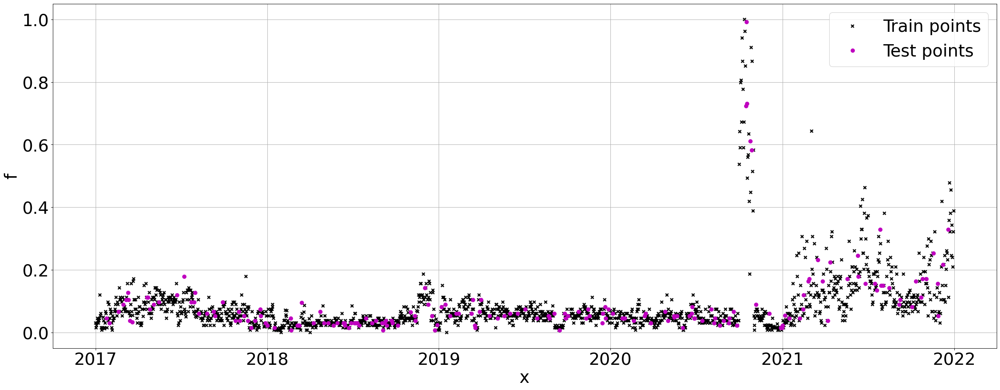

In [4]:
# X = np.array(DKI1.Tanggal.astype('int64') // 10**9)
X = np.array(DKI5.index).reshape(-1,1)
# X = np.array(DKI1['Tanggal']).reshape(-1,1)
Y = np.array(DKI5['NO2']).reshape(-1,1)

from sklearn.model_selection import train_test_split

train_X, test_X, train_Y, test_Y = train_test_split(X, Y, test_size=0.1, random_state=42, shuffle=True)

# Plot observations
plt.figure(figsize=(32, 12), dpi=80)
plt.plot(np.array(DKI5['Tanggal'].loc[train_X.flatten()]).reshape(-1,1), train_Y, "kx", mew=2, label='Train points')
plt.plot(np.array(DKI5['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), test_Y, "mo", mew=2, label='Test points')

# Annotate plot
plt.xlabel("x"), plt.ylabel("f")
plt.grid()
plt.legend()

#### Kernel
Optimizing kernel parameters

In [177]:
k1 = GPy.kern.RBF(1)
# k1.variance = 0.175
# k1.lengthscale = 22.44
m1 = GPy.models.GPRegression(train_X, train_Y, k1)
# m1.Gaussian_noise = 0.0055
# m1.Gaussian_noise = 0
# m1.Gaussian_noise.fix()

# Make a gamma prior and set it as the prior for the lengthscale
# gamma_prior = GPy.priors.Gamma.from_EV(1.5, 0.7)
# gamma_prior.plot()
# m1.rbf.lengthscale.set_prior(gamma_prior)

m1.optimize(messages=1, ipython_notebook=True)

In [178]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m1.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [5]:
from sklearn import metrics

def print_evaluate(true, predicted):  
    mae = metrics.mean_absolute_error(true, predicted)
    mse = metrics.mean_squared_error(true, predicted)
    rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
    r2_square = metrics.r2_score(true, predicted)
    mape = metrics.mean_absolute_percentage_error(true,predicted)
    print('MAE:', mae)
    print('MSE:', mse)
    print('RMSE:', rmse)
    print('MAPE:', mape)

    print('R2 Square', r2_square)
    print('__________________________________')

In [180]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y.flatten(), m1.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.03388159285564329
MSE: 0.00412589102524311
RMSE: 0.06423309914088772
MAPE: 149851028467.93503
R2 Square 0.615836327446413
__________________________________


In [181]:
metrics.r2_score(train_Y.flatten(), m1.predict(train_X)[0].flatten())

0.6851849099243701

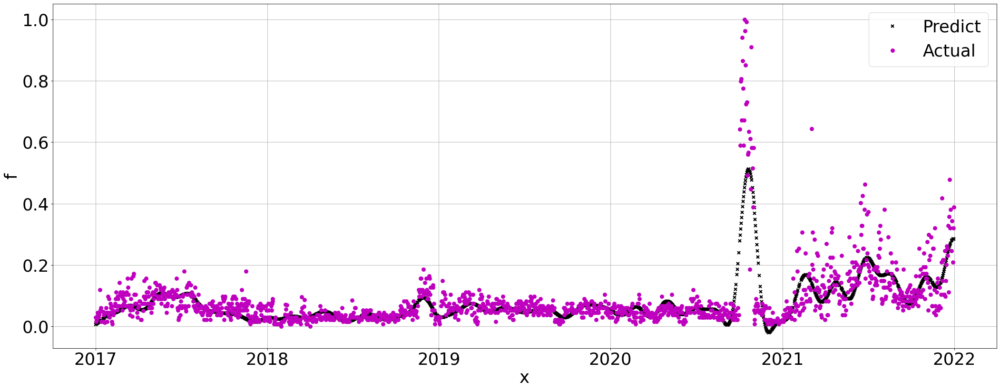

In [182]:
# Plot observations
plt.figure(figsize=(32, 12), dpi=80)
plt.plot(np.array(DKI5['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), m1.predict(test_X)[0], 'kx', mew=2, label='Predict')
plt.plot(np.array(DKI5['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), test_Y, 'mo', mew=2, label='Actual')

# Annotate plot
plt.xlabel("x"), plt.ylabel("f")
plt.grid()
plt.legend()

Periodic

In [183]:
k2 = GPy.kern.StdPeriodic(1, period=2)
m2 = GPy.models.GPRegression(train_X, train_Y, k2)
m2.optimize(messages=1, ipython_notebook=True)

In [184]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m2.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [185]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m2.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.04793115718859935
MSE: 0.009034599265128862
RMSE: 0.09505050902088248
MAPE: 243924074262.1473
R2 Square 0.15878417231406783
__________________________________


In [186]:
metrics.r2_score(train_Y.flatten(), m2.predict(train_X)[0].flatten())

0.19993672108822225

White

In [187]:
k3 = GPy.kern.White(1)
m3 = GPy.models.GPRegression(train_X, train_Y, k3)
m3.optimize(messages=1, ipython_notebook=True)

In [188]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m3.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [189]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m3.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.08409394435651249
MSE: 0.01781172166869497
RMSE: 0.1334605622223096
MAPE: 0.9987834549878345
R2 Square -0.6584578625280042
__________________________________


In [190]:
metrics.r2_score(train_Y.flatten(), m3.predict(train_X)[0].flatten())

-0.693397900465585

Linear

In [191]:
k4 = GPy.kern.Linear(1)
m4 = GPy.models.GPRegression(train_X, train_Y, k4)
m4.optimize(messages=1, ipython_notebook=True)

In [192]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m4.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [193]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m4.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.055576270014045644
MSE: 0.00983807431141244
RMSE: 0.09918706725885407
MAPE: 194964145375.21802
R2 Square 0.0839722292217816
__________________________________


In [194]:
metrics.r2_score(train_Y.flatten(), m4.predict(train_X)[0].flatten())

0.11647831714090173

Exponential

In [195]:
k5 = GPy.kern.Exponential(1)
m5 = GPy.models.GPRegression(train_X, train_Y, k5)
m5.optimize(messages=1, ipython_notebook=True)

In [196]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m5.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [197]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m5.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.03435917766633499
MSE: 0.004641751698521155
RMSE: 0.06813040216027758
MAPE: 161652361485.76538
R2 Square 0.5678042951993221
__________________________________


In [198]:
metrics.r2_score(train_Y.flatten(), m5.predict(train_X)[0].flatten())

0.7367817756845555

Matern32

In [6]:
k6 = GPy.kern.Matern32(1)
m6 = GPy.models.GPRegression(train_X, train_Y, k6)
m6.optimize(messages=1, ipython_notebook=True)

In [7]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m6.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [9]:
# Denormalisasi
max = 135.0
min = 1.0
test_Y_denorm = (test_Y.flatten() * (max - min) + min)
prediksi_denorm = (m6.predict(test_X)[0].flatten() * (max - min) + min)

In [10]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y_denorm, prediksi_denorm)

Evaluation:
_____________________________________
MAE: 3.212070051305805
MSE: 29.00712730300652
RMSE: 5.385826519950909
MAPE: 0.3058124996945769
R2 Square 0.8939349501305665
__________________________________


In [8]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m6.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.023970672024670188
MSE: 0.0016154559647475232
RMSE: 0.04019273522351425
MAPE: 0.38423030061055635
R2 Square 0.8939349501305665
__________________________________


In [202]:
metrics.r2_score(train_Y.flatten(), m6.predict(train_X)[0].flatten())

0.6751698918281396

Matern52

In [203]:
k7 = GPy.kern.Matern52(1)
m7 = GPy.models.GPRegression(train_X, train_Y, k7)
m7.optimize(messages=1, ipython_notebook=True)

In [204]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m7.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [205]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m7.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.03350765947391292
MSE: 0.00429302738530489
RMSE: 0.06552119798435381
MAPE: 156010040403.3491
R2 Square 0.6002741815957992
__________________________________


In [206]:
metrics.r2_score(train_Y.flatten(), m7.predict(train_X)[0].flatten())

0.6725625816914065

Brownian

In [207]:
k8 = GPy.kern.Brownian(1)
m8 = GPy.models.GPRegression(train_X, train_Y, k8)
m8.optimize(messages=1, ipython_notebook=True)

In [208]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m8.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [209]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m8.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.040457456025302596
MSE: 0.006312863446373238
RMSE: 0.07945353010642911
MAPE: 173224474745.70657
R2 Square 0.41220628682379257
__________________________________


In [210]:
metrics.r2_score(train_Y.flatten(), m8.predict(train_X)[0].flatten())

0.5041002564299353

Bias

In [211]:
k9 = GPy.kern.Bias(1)
m9 = GPy.models.GPRegression(train_X, train_Y, k9)
m9.optimize(messages=1, ipython_notebook=True)

In [212]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m9.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [213]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m9.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.053238542535854035
MSE: 0.010777047986042468
RMSE: 0.103812561793082
MAPE: 427357125523.2126
R2 Square -0.003456055497821353
__________________________________


In [214]:
metrics.r2_score(train_Y.flatten(), m9.predict(train_X)[0].flatten())

-4.402176281237402e-05

Periodik Eksponensial

In [215]:
k10 = GPy.kern.PeriodicExponential(1)
m10 = GPy.models.GPRegression(train_X, train_Y, k10)
m10.optimize(messages=1, ipython_notebook=True)

In [216]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m10.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [217]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m10.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.08446073750588827
MSE: 0.018088956491481182
RMSE: 0.1344951913321855
MAPE: 38322437631.87625
R2 Square -0.6842713285235147
__________________________________


In [218]:
metrics.r2_score(train_Y.flatten(), m10.predict(train_X)[0].flatten())

-0.6243673729861332